# Precipitations
env: `phd_v3`

Voir : https://github.com/mickaellalande/PhD/blob/master/CICLAD/Himalaya/CMIP6_IPSL_bias/Precipitation.ipynb pour plus de détails

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle # For rectangles
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats # For linregress (trends)
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '../../../') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]
Virtual memory usage - total: 252 GB / available: 96 GB / percent used: 61.7 %


# Load model data

In [2]:
# Define period
period = slice('1982','2014')

# Define zone
latlim=(10,50)
lonlim=(60,110)

# Model
institute = 'IPSL'
model = 'IPSL-CM6A-LR'
var = 'pr'
# var = 'prsn'
if var in ['tas', 'pr', 'prsn']:
    table = 'Amon'
elif var in ['snc']:
    table = 'LImon'
    
var_label = 'Total precipitation [mm/day]'
var_label_trends = 'Total precipitation trends [mm/day/dec]'
var_label_bias = 'Total precipitation bias [mm/day]'
cmap='DryWet'
levels=plot.arange(0,10,0.5)

## Load ensemble mean

In [3]:
var = 'pr'
realization = 'ens'
# Load historical ens
experiment='historical'
da_historical = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
).sel(time=period)
# Load amip ens
experiment='amip'
da_amip = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
).sel(time=period)

# No ensembles for land-hist and HR
realization = 'r1i1p1f1'
# Load land-hist
da_land_hist = xr.open_mfdataset(
    '/bdd/CMIP6/LS3MIP/'+institute+'/'+model+'/land-hist/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]
# Load HighResMIP
da_HR = xr.open_mfdataset(
    '/bdd/CMIP6/HighResMIP/'+institute+'/IPSL-CM6A-ATM-HR/highresSST-present/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

In [4]:
var = 'prsn'
realization = 'ens'
# Load historical ens
experiment='historical'
da_historical_sn = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
).sel(time=period)
# Load amip ens
experiment='amip'
da_amip_sn = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
).sel(time=period)

# No ensembles for land-hist and HR
realization = 'r1i1p1f1'
# Load land-hist
da_land_hist_sn = xr.open_mfdataset(
    '/bdd/CMIP6/LS3MIP/'+institute+'/'+model+'/land-hist/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]
# Load HighResMIP
da_HR_sn = xr.open_mfdataset(
    '/bdd/CMIP6/HighResMIP/'+institute+'/IPSL-CM6A-ATM-HR/highresSST-present/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

### Convert units

In [5]:
# To mm/day
da_historical = da_historical*86400
da_amip = da_amip*86400
da_land_hist = da_land_hist*86400
da_HR = da_HR*86400

da_historical_sn = da_historical_sn*86400
da_amip_sn = da_amip_sn*86400
da_land_hist_sn = da_land_hist_sn*86400
da_HR_sn = da_HR_sn*86400

## Load obs

### APHRODITE http://aphrodite.st.hirosaki-u.ac.jp/download/data/search/  
http://aphrodite.st.hirosaki-u.ac.jp/download/
V1101 et V1101EX_R1 domain MA

In [6]:
obs_longname = 'APHRODITE V1101 (0.5°)'
obs_name = 'APHRODITE'

In [7]:
obs_V1101 = xr.open_mfdataset(
    '/data/mlalande/APHRODITE/APHRO_MA_050deg_V1101.*.nc', combine='by_coords'
).precip

obs_V1101_EXR1 = xr.open_mfdataset(
    '/data/mlalande/APHRODITE/APHRO_MA_050deg_V1101_EXR1.*.nc', combine='by_coords'
).precip

obs_V1101 = obs_V1101.rename({'longitude': 'lon', 'latitude': 'lat'})
obs = xr.combine_nested([obs_V1101, obs_V1101_EXR1], concat_dim='time')

obs = obs.resample(time='1MS').mean('time').sel(time=period)

/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


### Regrid using xESMF (https://xesmf.readthedocs.io/en/latest/) 

In [8]:
# For adding NaN values outside of the grid, otherwise it puts 0 (see issue just up #15)
import scipy
def add_matrix_NaNs(regridder):
    X = regridder.weights
    M = scipy.sparse.csr_matrix(X)
    num_nonzeros = np.diff(M.indptr)
    M[num_nonzeros == 0, 0] = np.NaN
    regridder.weights = scipy.sparse.coo_matrix(M)
    return regridder

# Make the regrider
regridder_obs = xe.Regridder(obs, da_historical, 'bilinear', periodic=False, reuse_weights=True)
regridder_obs = add_matrix_NaNs(regridder_obs)
print(regridder_obs)

# Regrid the data
obs_regrid = regridder_obs(obs)

Reuse existing file: bilinear_140x180_143x144.nc


/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_140x180_143x144.nc 
Reuse pre-computed weights? True 
Input grid shape:           (140, 180) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      False


/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


Text(0.5, 1.0, 'Regrid')

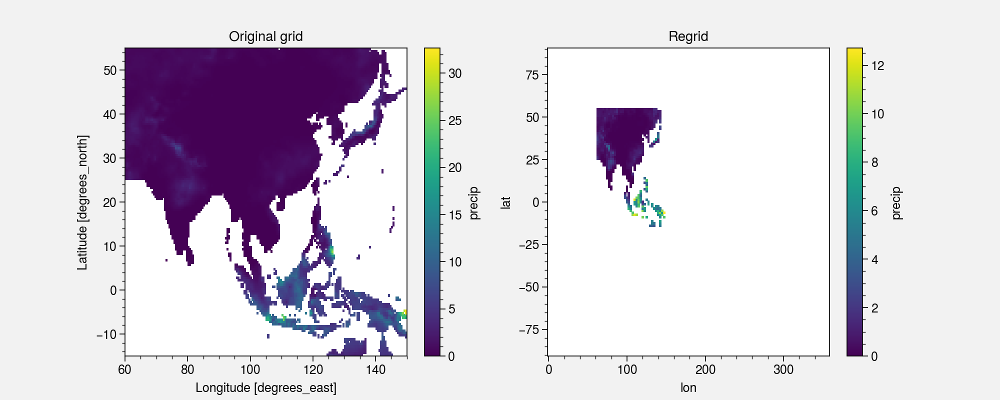

In [9]:
plt.figure(figsize=(10,4))
plt.subplot(121)
obs[0].plot()
plt.title('Original grid')
plt.subplot(122)
obs_regrid[0].plot()
plt.title('Regrid')

### Regrid HR

In [10]:
# Regrid HighResMIP
regridder_HR = xe.Regridder(da_HR, da_historical, 'bilinear', periodic=True, reuse_weights=True)
print(regridder_HR)

# Regrid the data
da_HR_regrid = regridder_HR(da_HR)

Reuse existing file: bilinear_361x512_143x144_peri.nc
xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_361x512_143x144_peri.nc 
Reuse pre-computed weights? True 
Input grid shape:           (361, 512) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      True


Text(0.5, 1.0, 'da_HR_regrid')

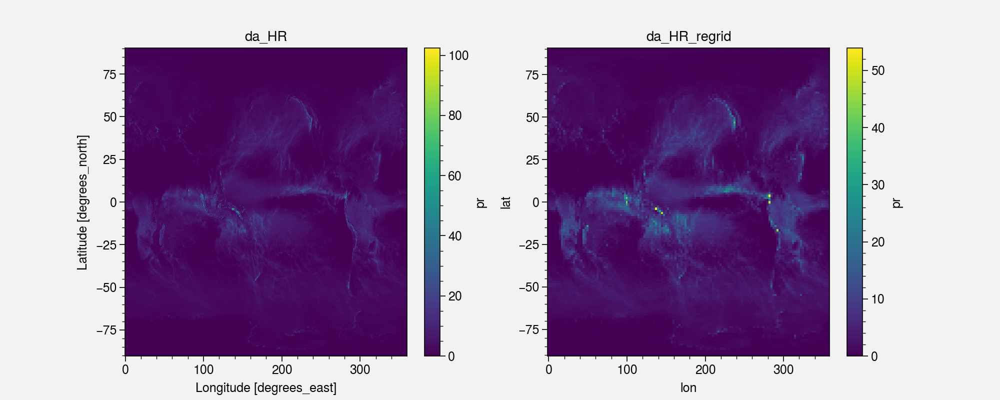

In [11]:
plt.figure(figsize=(10,4))
plt.subplot(121)
da_HR[0].plot()
plt.title('da_HR')
plt.subplot(122)
da_HR_regrid[0].plot()
plt.title('da_HR_regrid')

## Load ERA-Interim

In [12]:
era = xr.open_mfdataset('/data/mlalande/ERAI/tp/tp_ERAI_*.nc', combine='by_coords').tp.sel(time=period).load()
# mm/day
era = era.rename({'longitude': 'lon', 'latitude': 'lat'})
era = era*1000
regridder_ERAI = xe.Regridder(era, da_historical, 'bilinear', periodic=True, reuse_weights=True)
era_regrid = regridder_ERAI(era)

Reuse existing file: bilinear_241x480_143x144_peri.nc


Text(0.5, 1.0, 'Regrid')

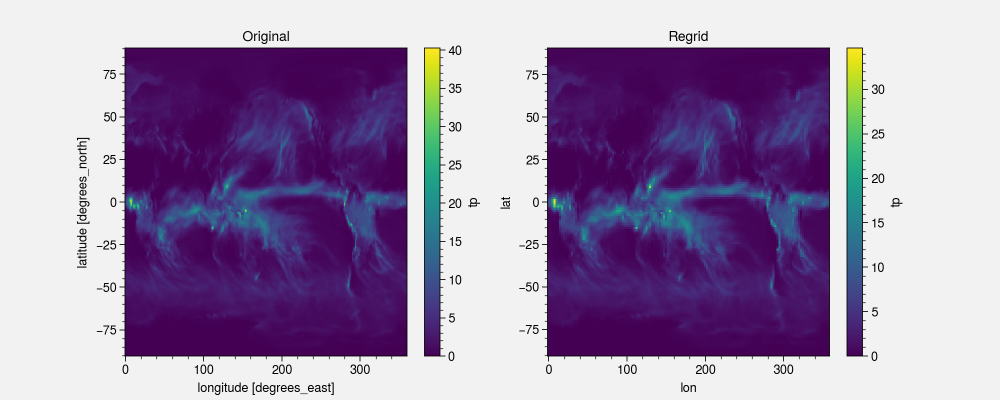

In [13]:
plt.figure(figsize=(10,4))
plt.subplot(121)
era[0].plot()
plt.title('Original')
plt.subplot(122)
era_regrid[0].plot()
plt.title('Regrid')

## GPCP CDR v2.3 (2.5°)
https://www.ncdc.noaa.gov/cdr/atmospheric/precipitation-gpcp-monthly

In [14]:
ds = xr.open_mfdataset(
    '/data/mlalande/GPCP/CDR_monthly_v2.3/*/gpcp_v02r03_monthly_d*_c20170616.nc'
).precip.sel(time=period)

gpcp = ds.rename({'longitude': 'lon', 'latitude': 'lat'})

In [15]:
# Make the regrider
regridder_obs = xe.Regridder(gpcp, da_historical, 'bilinear', periodic=True, reuse_weights=True)
print(regridder_obs)

# Regrid the data
gpcp_regrid = regridder_obs(gpcp)

Reuse existing file: bilinear_72x144_143x144_peri.nc
xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_72x144_143x144_peri.nc 
Reuse pre-computed weights? True 
Input grid shape:           (72, 144) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      True


Text(0.5, 1.0, 'gpcp_regrid')

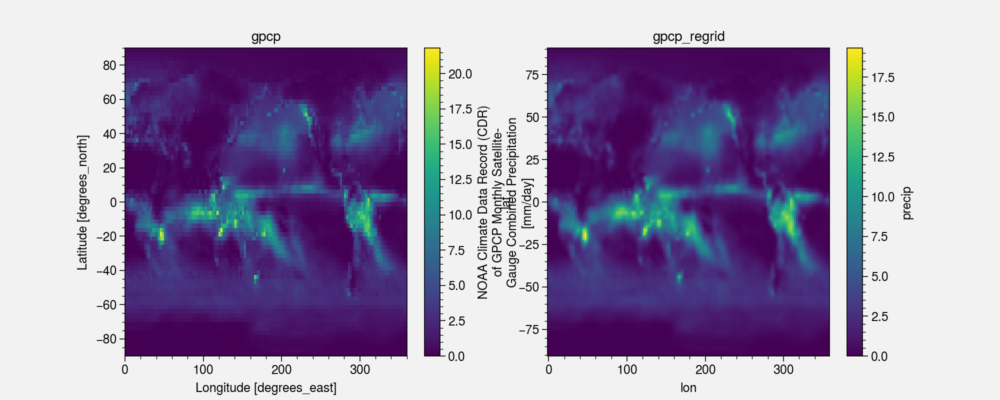

In [16]:
plt.figure(figsize=(10,4))
plt.subplot(121)
gpcp[0].plot()
plt.title('gpcp')
plt.subplot(122)
gpcp_regrid[0].plot()
plt.title('gpcp_regrid')

## Annual Climatology

In [17]:
latlim=(10,50)
lonlim=(60,110)

da_historical_clim = u.clim(da_historical.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_historical_clim.load()

da_amip_clim = u.clim(da_amip.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_amip_clim.load()

da_land_hist_clim = u.clim(da_land_hist.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_land_hist_clim.load()

da_HR_regrid_clim = u.clim(da_HR_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_HR_regrid_clim.load()

da_HR_clim = u.clim(da_HR.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_HR_clim.load()

obs_regrid_clim = u.clim(obs_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
obs_regrid_clim.load()

obs_clim = u.clim(obs.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
obs_clim.load()

gpcp_regrid_clim = u.clim(gpcp_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
gpcp_regrid_clim.load()

gpcp_clim = u.clim(gpcp.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
gpcp_clim.load()

era_regrid_clim = u.clim(era_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
era_regrid_clim.load()

era_clim = u.clim(era.sel(lat=slice(latlim[1],latlim[0]), lon=slice(lonlim[0],lonlim[1])))
era_clim.load()

/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


<xarray.DataArray (lat: 53, lon: 67)>
array([[0.82109718, 0.78612874, 0.75088749, ..., 1.64135318, 1.63564617,
        1.60546013],
       [0.70541816, 0.66914531, 0.64640315, ..., 1.48589541, 1.41864278,
        1.30750598],
       [0.64063909, 0.60324343, 0.57607977, ..., 1.09660963, 1.05569409,
        1.02971692],
       ...,
       [1.09041934, 1.19365216, 1.2965152 , ..., 4.80708546, 4.62038939,
        4.20862079],
       [1.27068456, 1.39612591, 1.50513219, ..., 5.0610155 , 4.03582467,
        4.14740194],
       [1.50371182, 1.62551403, 1.77446098, ..., 5.38727026, 4.69120537,
        5.71396774]])
Coordinates:
  * lon      (lon) float32 60.0 60.75 61.5 62.25 ... 107.25 108.0 108.75 109.5
  * lat      (lat) float32 49.5 48.75 48.0 47.25 46.5 ... 12.75 12.0 11.25 10.5

In [18]:
# We remove HR for keeping the resolution

concat = xr.concat(
    [
        da_historical_clim,
        da_amip_clim,
        da_land_hist_clim,
    ],
    pd.Index(
        [
            'Historical (32)',
            'AMIP (21)',
            'land-hist (1)',
        ], 
        name='exp'
    )
)

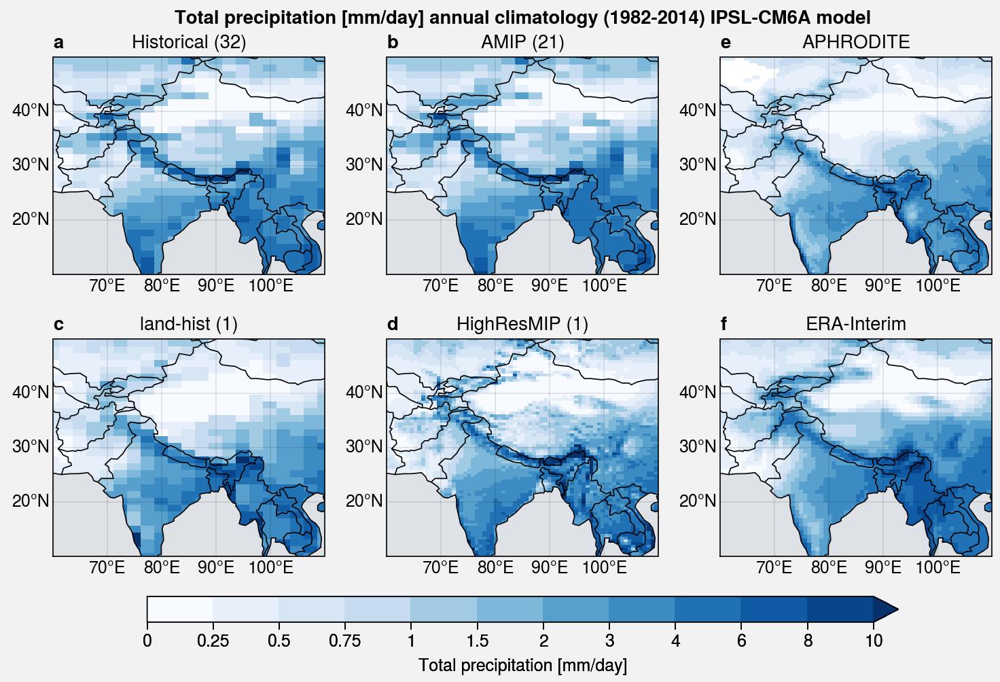

In [19]:
# Final plot

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', axwidth=2)

extend='max'
levels=[0, 0.25, 0.5, 0.75, 1, 1.5, 2, 3, 4, 6, 8, 10]
cmap = 'Blues'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i), cmap=cmap, levels=levels, extend=extend)
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(da_HR_clim, cmap=cmap, levels=levels, extend=extend)
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(obs_clim, cmap=cmap, levels=levels, extend=extend)
axs[4].format(title='APHRODITE') 

axs[5].pcolormesh(era_clim, cmap=cmap, levels=levels, extend=extend)
axs[5].format(title='ERA-Interim')

f.colorbar(m, label=var_label, loc='b', length=0.8)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=var_label+" annual climatology (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/pr_clim_1982-2014_IPSL-CM6A_exp.jpg')

## Bias

In [20]:
bias = xr.concat(
    [
        (da_historical_clim-obs_regrid_clim),
        (da_amip_clim-obs_regrid_clim),
        (da_land_hist_clim-obs_regrid_clim),
        (da_HR_regrid_clim-obs_regrid_clim)
    ],
    pd.Index(
        [
            'Historical (32) - '+obs_name,
            'AMIP (21) - '+obs_name,
            'land-hist (1) - '+obs_name,
            'HighResMIP (1) - '+obs_name
        ], 
        name='bias'
    )
)

In [21]:
bias_relative = xr.concat(
    [
        (da_historical_clim-obs_regrid_clim)/obs_regrid_clim,
        (da_amip_clim-obs_regrid_clim)/obs_regrid_clim,
        (da_land_hist_clim-obs_regrid_clim)/obs_regrid_clim,
        (da_HR_regrid_clim-obs_regrid_clim)/obs_regrid_clim
    ],
    pd.Index(
        [
            'Historical (32) - '+obs_name,
            'AMIP (21) - '+obs_name,
            'land-hist (1) - '+obs_name,
            'HighResMIP (1) - '+obs_name
        ], 
        name='bias'
    )
)

In [22]:
bias_relative_ERA = xr.concat(
    [
        (da_historical_clim-era_regrid_clim)/era_regrid_clim,
        (da_amip_clim-era_regrid_clim)/era_regrid_clim,
        (da_land_hist_clim-era_regrid_clim)/era_regrid_clim,
        (da_HR_regrid_clim-era_regrid_clim)/era_regrid_clim
    ],
    pd.Index(
        [
            'Historical (32) - ERA-Interim',
            'AMIP (21) - ERA-Interim',
            'land-hist (1) - ERA-Interim',
            'HighResMIP (1) - ERA-Interim'
        ], 
        name='bias'
    )
)

In [23]:
bias_relative_gpcp = xr.concat(
    [
        (da_historical_clim-gpcp_regrid_clim)/gpcp_regrid_clim,
        (da_amip_clim-gpcp_regrid_clim)/gpcp_regrid_clim,
        (da_land_hist_clim-gpcp_regrid_clim)/gpcp_regrid_clim,
        (da_HR_regrid_clim-gpcp_regrid_clim)/gpcp_regrid_clim
    ],
    pd.Index(
        [
            'Historical (32) - GPCP',
            'AMIP (21) - GPCP',
            'land-hist (1) - GPCP',
            'HighResMIP (1) - GPCP'
        ], 
        name='bias'
    )
)

In [24]:
bias.min()

<xarray.DataArray ()>
array(-7.0351259)

In [25]:
bias.max()

<xarray.DataArray ()>
array(20.14089466)

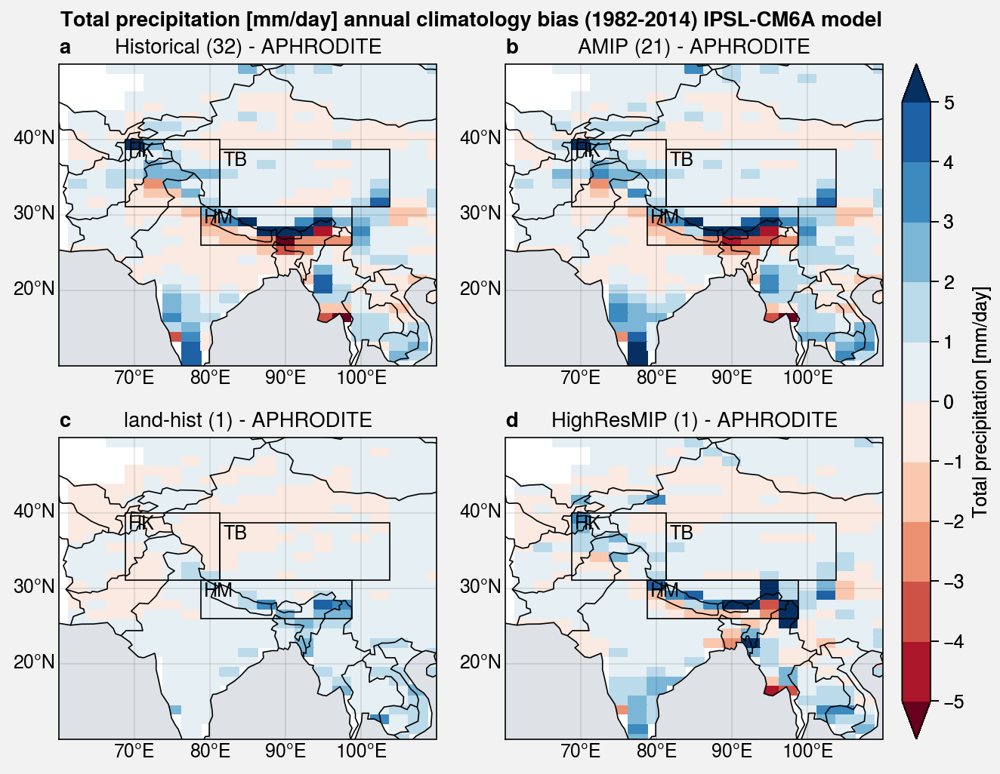

In [26]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, axwidth=2.5)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias.isel(bias=i), 
        cmap='RdBu', 
        levels=plot.arange(-5, 5, 1), 
        extend='both',
    )
    ax.format(title=str(bias.isel(bias=i).bias.values))

f.colorbar(m, label=var_label)

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=var_label+" annual climatology bias (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/pr_clim_bias_1982-2014_IPSL-CM6A_APHRO.jpg')

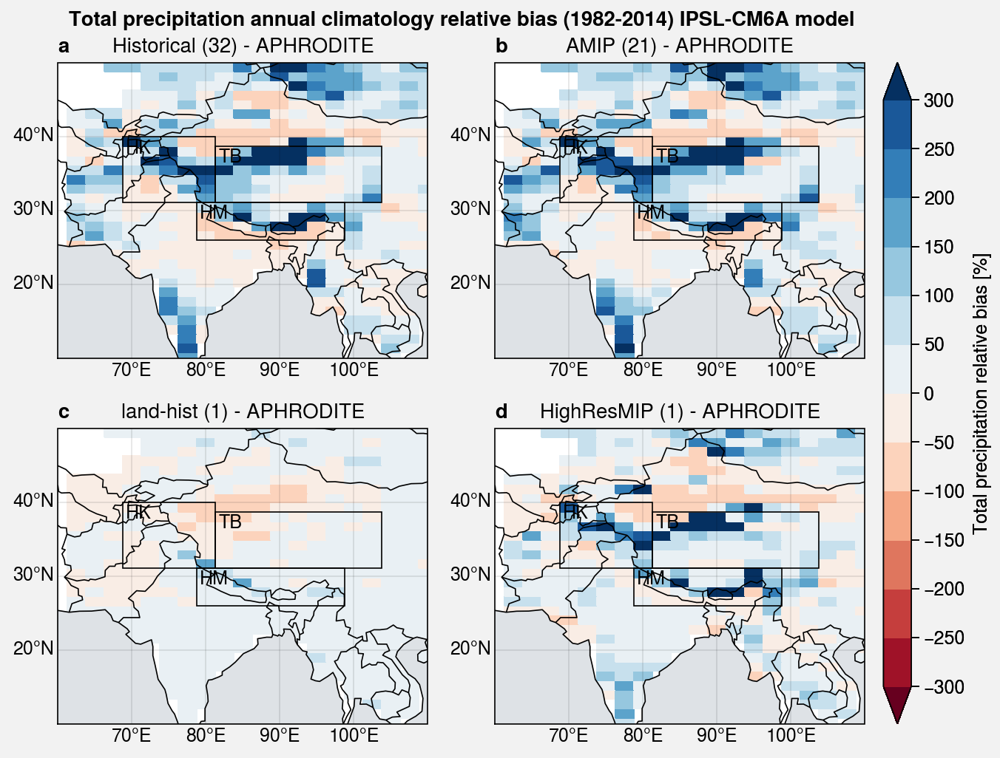

In [27]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, axwidth=2.5)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias_relative.isel(bias=i)*100, 
        cmap='RdBu', 
        levels=plot.arange(-300,300,50), 
        extend='both',
    )
    ax.format(title=str(bias.isel(bias=i).bias.values))

f.colorbar(m, label='Total precipitation relative bias [%]')

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Total precipitation annual climatology relative bias (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/pr_clim_rel_bias_1982-2014_IPSL-CM6A_APHRO.jpg')

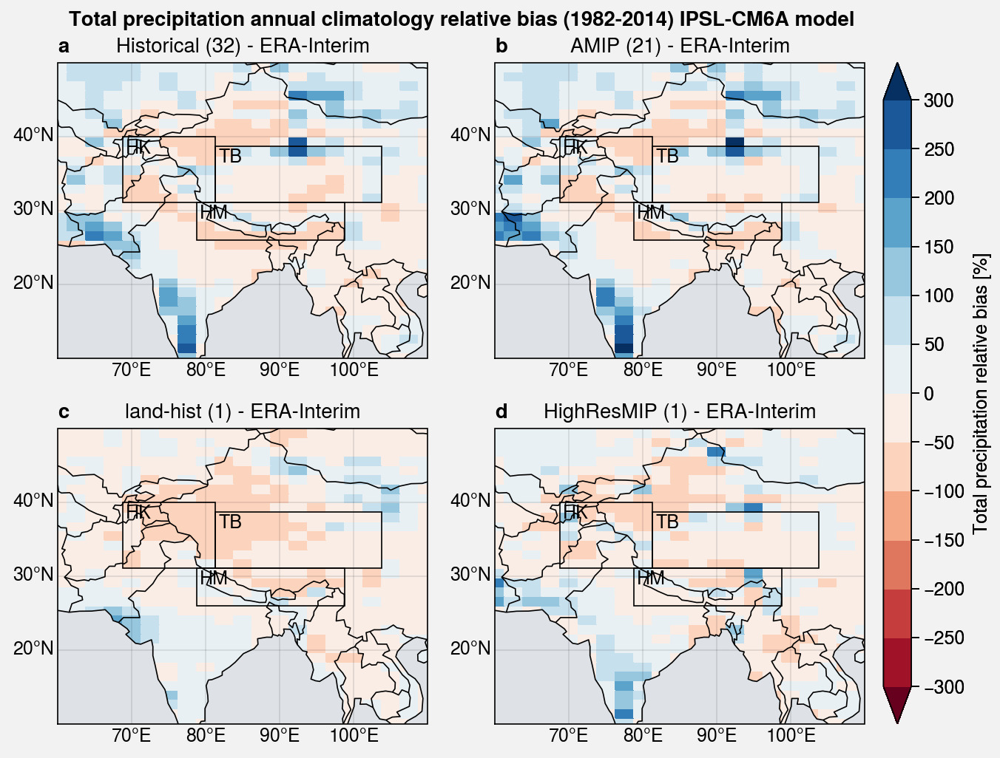

In [28]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, axwidth=2.5)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias_relative_ERA.isel(bias=i)*100, 
        cmap='RdBu', 
        levels=plot.arange(-300,300,50), 
        extend='both',
    )
    ax.format(title=str(bias_relative_ERA.isel(bias=i).bias.values))

f.colorbar(m, label='Total precipitation relative bias [%]')

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Total precipitation annual climatology relative bias (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/pr_clim_rel_bias_1982-2014_IPSL-CM6A_ERAI.jpg')

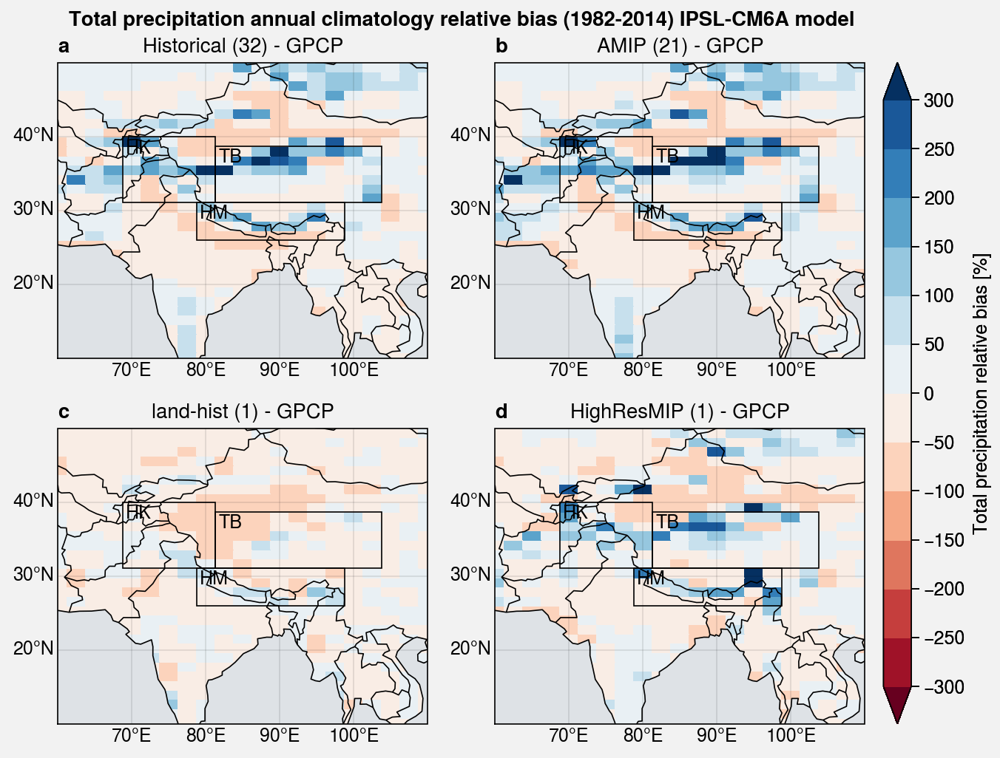

In [29]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, axwidth=2.5)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias_relative_gpcp.isel(bias=i)*100, 
        cmap='RdBu', 
        levels=plot.arange(-300,300,50), 
        extend='both',
    )
    ax.format(title=str(bias_relative_gpcp.isel(bias=i).bias.values))

f.colorbar(m, label='Total precipitation relative bias [%]')

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Total precipitation annual climatology relative bias (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/pr_clim_rel_bias_1982-2014_IPSL-CM6A_GPCP.jpg')

## Monthly global bias

In [30]:
da_historical_mon = da_historical.groupby('time.month').mean()
da_historical_mon.load()

da_amip_mon = da_amip.groupby('time.month').mean()
da_amip_mon.load()

da_land_hist_mon = da_land_hist.groupby('time.month').mean()
da_land_hist_mon.load()

da_HR_regrid_mon = da_HR_regrid.groupby('time.month').mean()
da_HR_regrid_mon.load()

gpcp_regrid_mon = gpcp_regrid.groupby('time.month').mean()
gpcp_regrid_mon.load()

/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


<xarray.DataArray 'precip' (month: 12, lat: 143, lon: 144)>
array([[[0.07782499, 0.07782499, 0.07782499, ..., 0.07782499,
         0.07782499, 0.07782499],
        [0.01765874, 0.02478525, 0.03228754, ..., 0.02208548,
         0.02456082, 0.01926592],
        [0.01869214, 0.02098313, 0.02566903, ..., 0.02592298,
         0.02555279, 0.02159304],
        ...,
        [0.48148437, 0.47591181, 0.4683179 , ..., 0.46915144,
         0.4605194 , 0.47366713],
        [0.47377898, 0.45792928, 0.44579697, ..., 0.46589772,
         0.44979953, 0.45789859],
        [0.41947893, 0.41947893, 0.41947893, ..., 0.41947893,
         0.41947893, 0.41947893]],

       [[0.18388363, 0.18388363, 0.18388363, ..., 0.18388363,
         0.18388363, 0.18388363],
        [0.06240729, 0.06252977, 0.06721445, ..., 0.03801814,
         0.0462714 , 0.05762057],
        [0.05770627, 0.05732666, 0.05997739, ..., 0.04201169,
         0.04357163, 0.05208724],
...
        [0.43573996, 0.43695209, 0.43782864, ..., 0.43147641,
         0.42525224, 0.42793802],
        [0.38730713, 0.3777077 , 0.37759927, ..., 0.38900645,
         0.37700913, 0.38059992],
        [0.38331177, 0.38331177, 0.38331177, ..., 0.38331177,
         0.38331177, 0.38331177]],

       [[0.08447437, 0.08447437, 0.08447437, ..., 0.08447437,
         0.08447437, 0.08447437],
        [0.05121787, 0.0544154 , 0.05307811, ..., 0.05113909,
         0.05458998, 0.05188527],
        [0.04430833, 0.0435505 , 0.04552573, ..., 0.04527831,
         0.0502247 , 0.04933826],
        ...,
        [0.41185527, 0.41119265, 0.4027713 , ..., 0.4249746 ,
         0.42895364, 0.41790292],
        [0.38277937, 0.38240596, 0.37111106, ..., 0.39178826,
         0.40262796, 0.4004744 ],
        [0.35085332, 0.35085332, 0.35085332, ..., 0.35085332,
         0.35085332, 0.35085332]]])
Coordinates:
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [31]:
import calendar as cld

In [32]:
var_label[:-9]

'Total precipitation'

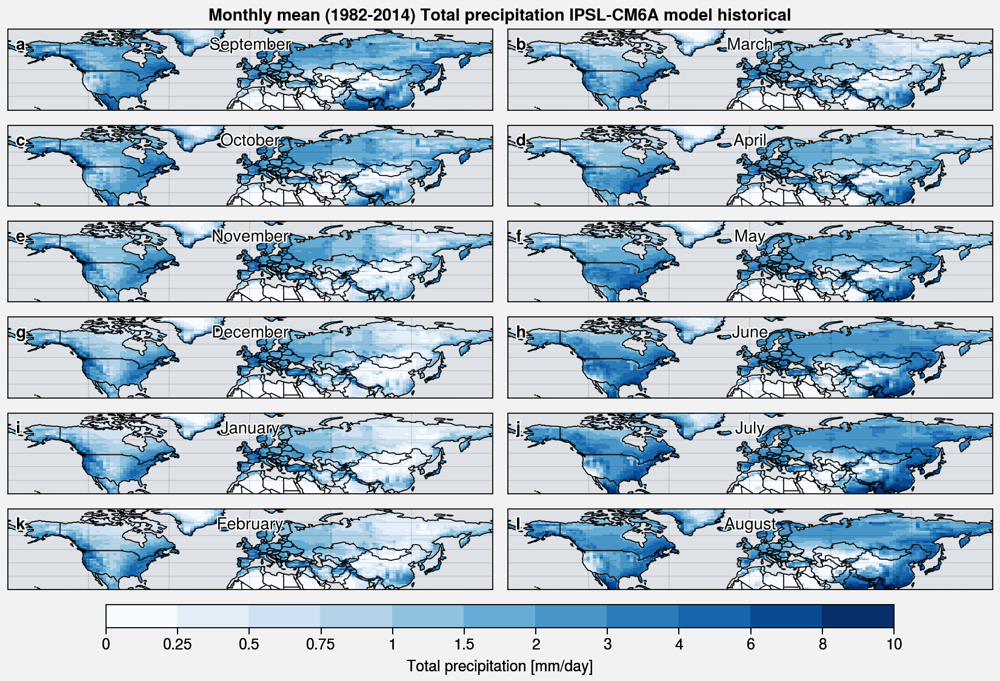

In [33]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_historical_mon.sel(month=i), cmap=cmap, levels=levels)
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label, loc='b', length=0.8)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" IPSL-CM6A model historical",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_clim_1982-2014_hist.jpg')

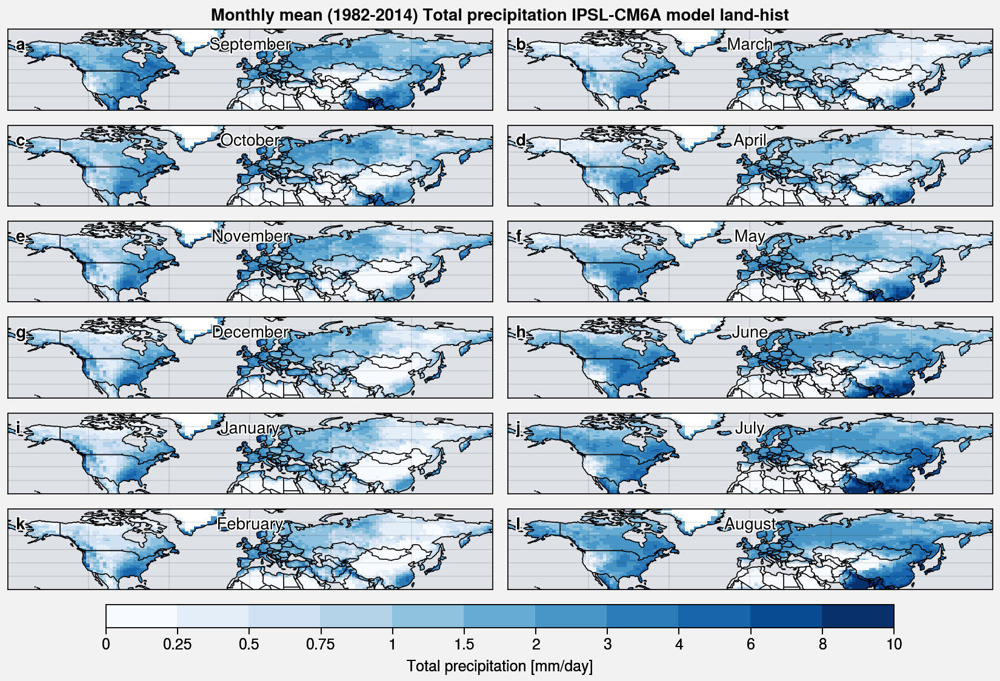

In [34]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_land_hist_mon.sel(month=i), cmap=cmap, levels=levels)
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label, loc='b', length=0.8)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" IPSL-CM6A model land-hist",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_clim_1982-2014_land-hist.jpg')

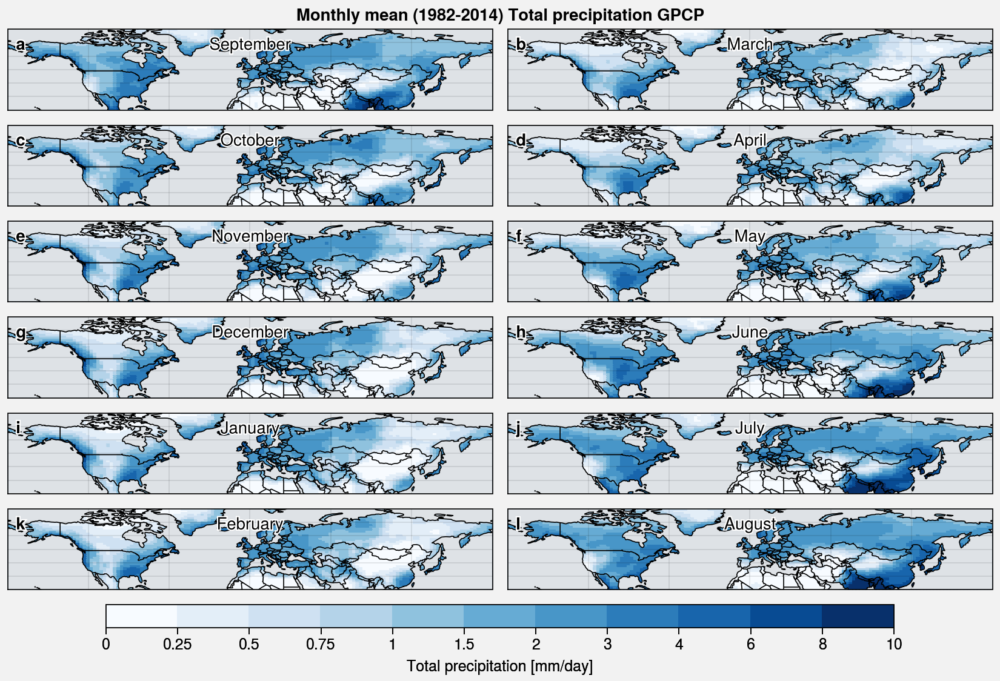

In [35]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(gpcp_regrid_mon.sel(month=i), cmap=cmap, levels=levels)
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label, loc='b', length=0.8)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_clim_1982-2014_gpcp.jpg')

### Bias

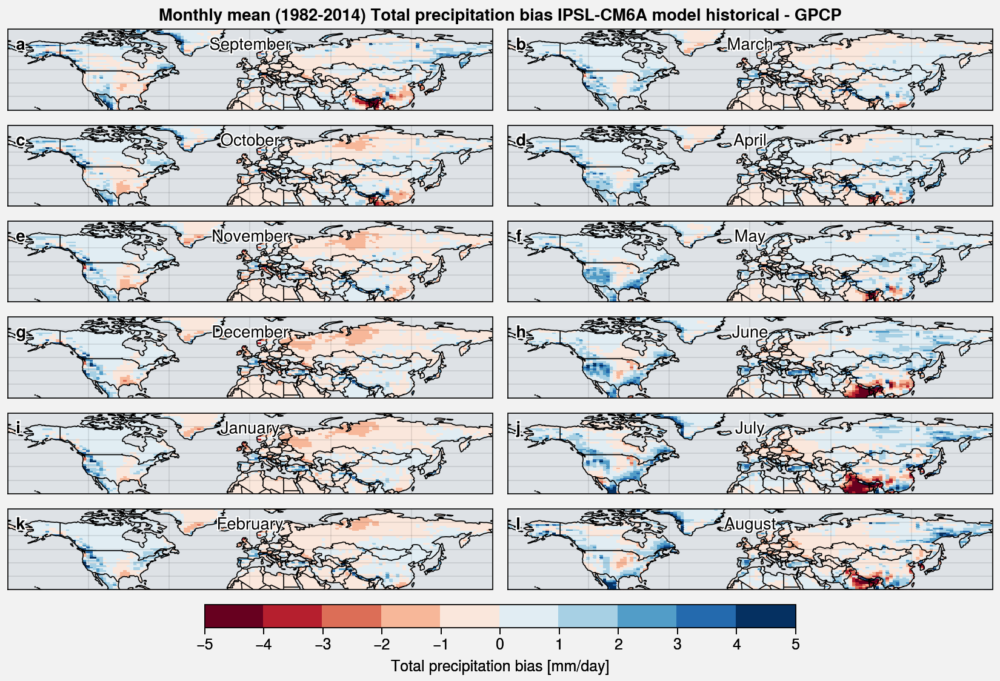

In [36]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_historical_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i), cmap='RdBu', levels=plot.arange(-5, 5, 1))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" bias IPSL-CM6A model historical - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_bias_1982-2014_hist_GPCP.jpg')

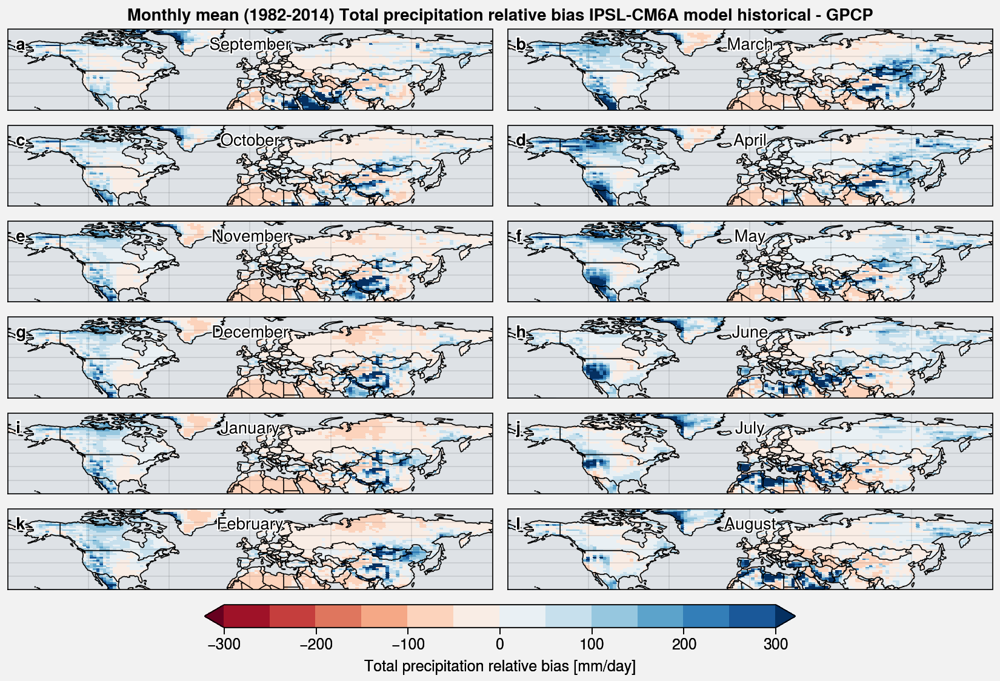

In [37]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh((da_historical_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i))/gpcp_regrid_mon.sel(month=i)*100, cmap='RdBu', levels=plot.arange(-300,300,50), extend='both')
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' relative bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" relative bias IPSL-CM6A model historical - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_rel_bias_1982-2014_hist_GPCP.jpg')

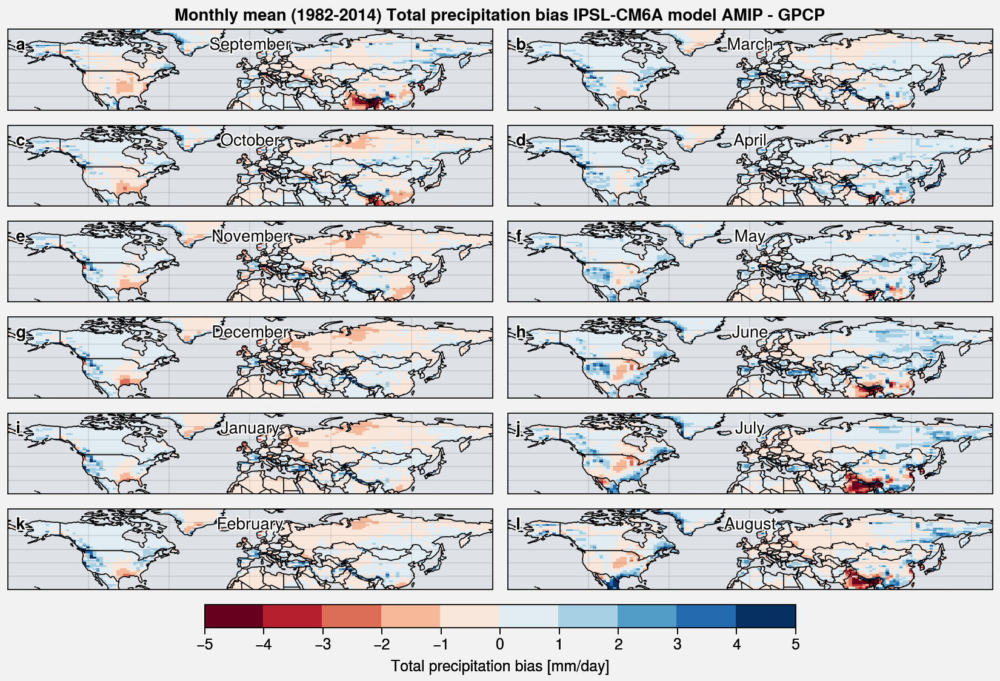

In [38]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_amip_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i), cmap='RdBu', levels=plot.arange(-5, 5, 1))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" bias IPSL-CM6A model AMIP - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_bias_1982-2014_amip_GPCP.jpg')

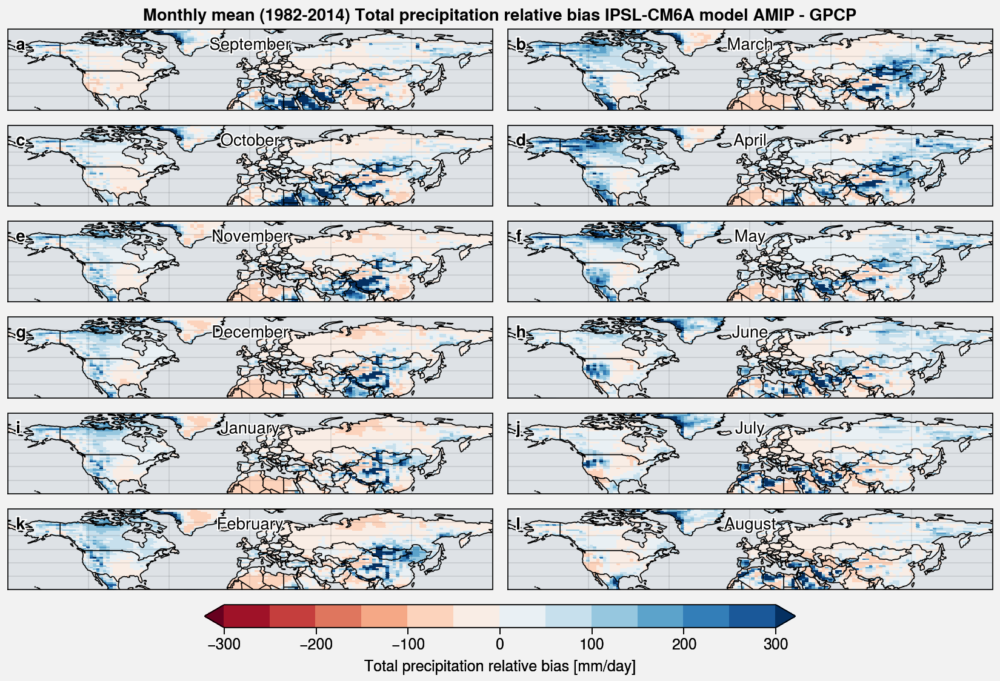

In [39]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh((da_amip_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i))/gpcp_regrid_mon.sel(month=i)*100, cmap='RdBu', levels=plot.arange(-300,300,50), extend='both')
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' relative bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" relative bias IPSL-CM6A model AMIP - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_rel_bias_1982-2014_amip_GPCP.jpg')

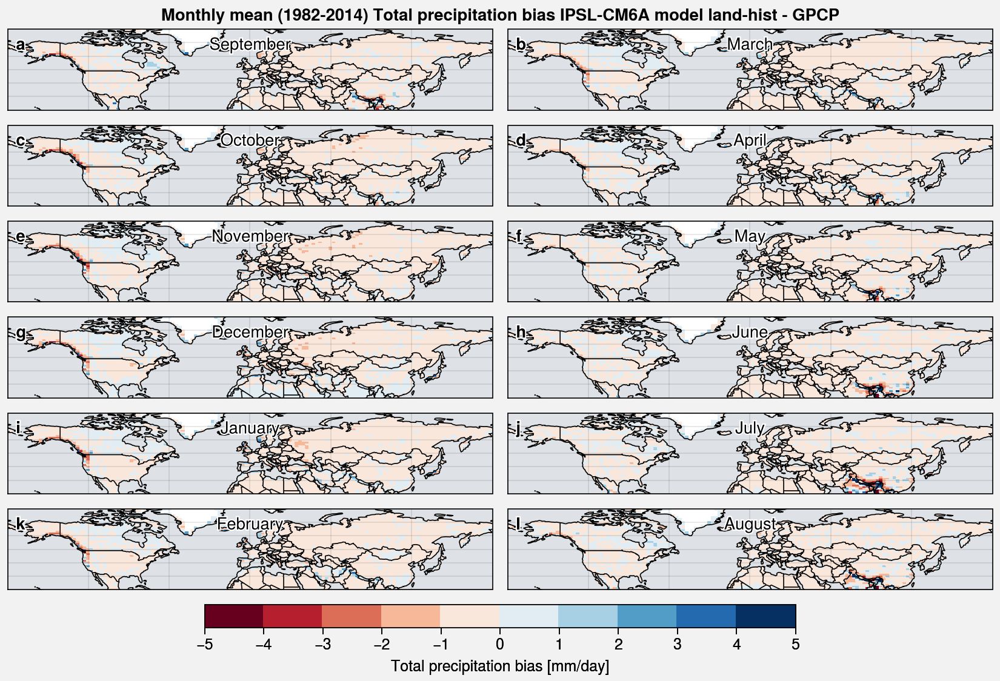

In [40]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_land_hist_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i), cmap='RdBu', levels=plot.arange(-5, 5, 1))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" bias IPSL-CM6A model land-hist - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_bias_1982-2014_land-hist_GPCP.jpg')

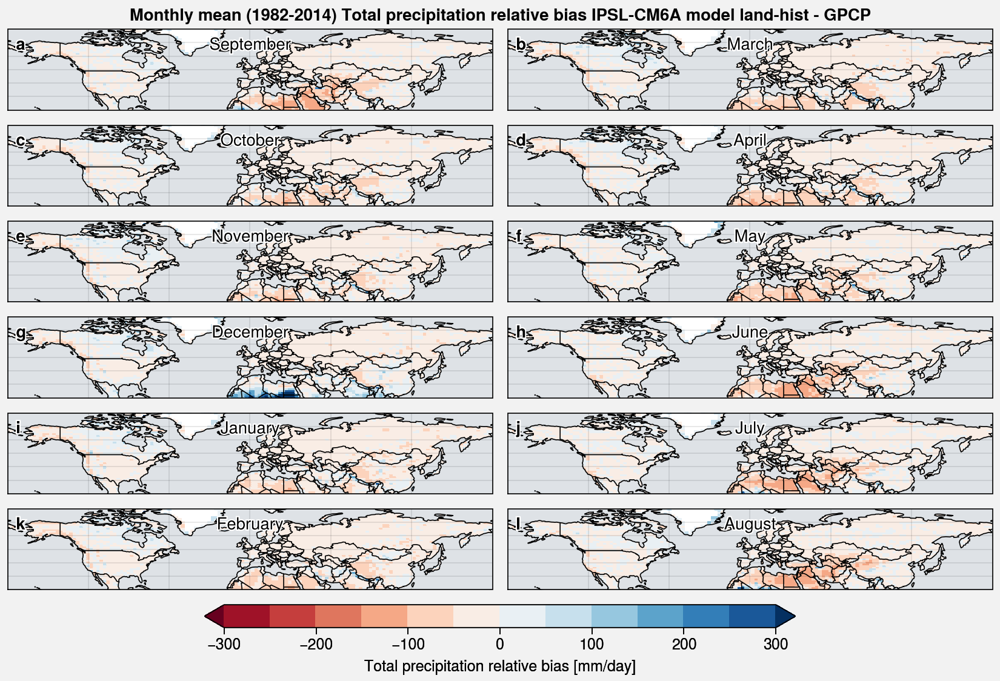

In [41]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh((da_land_hist_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i))/gpcp_regrid_mon.sel(month=i)*100, cmap='RdBu', levels=plot.arange(-300,300,50), extend='both')
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' relative bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" relative bias IPSL-CM6A model land-hist - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_rel_bias_1982-2014_land-hist_GPCP.jpg')

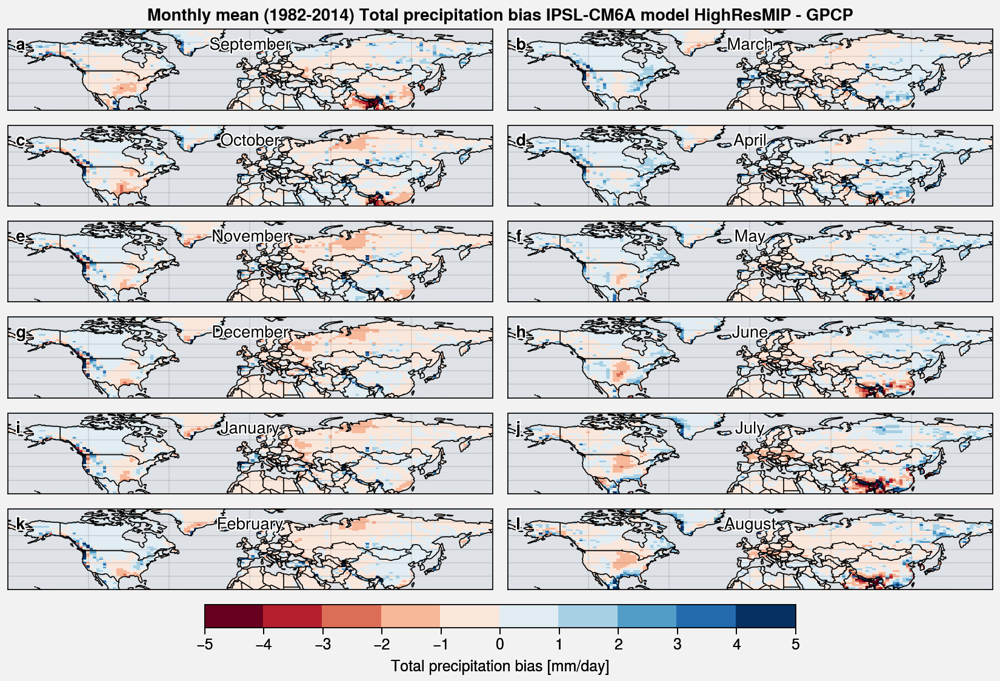

In [42]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_HR_regrid_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i), cmap='RdBu', levels=plot.arange(-5, 5, 1))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" bias IPSL-CM6A model HighResMIP - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_bias_1982-2014_HR_GPCP.jpg')

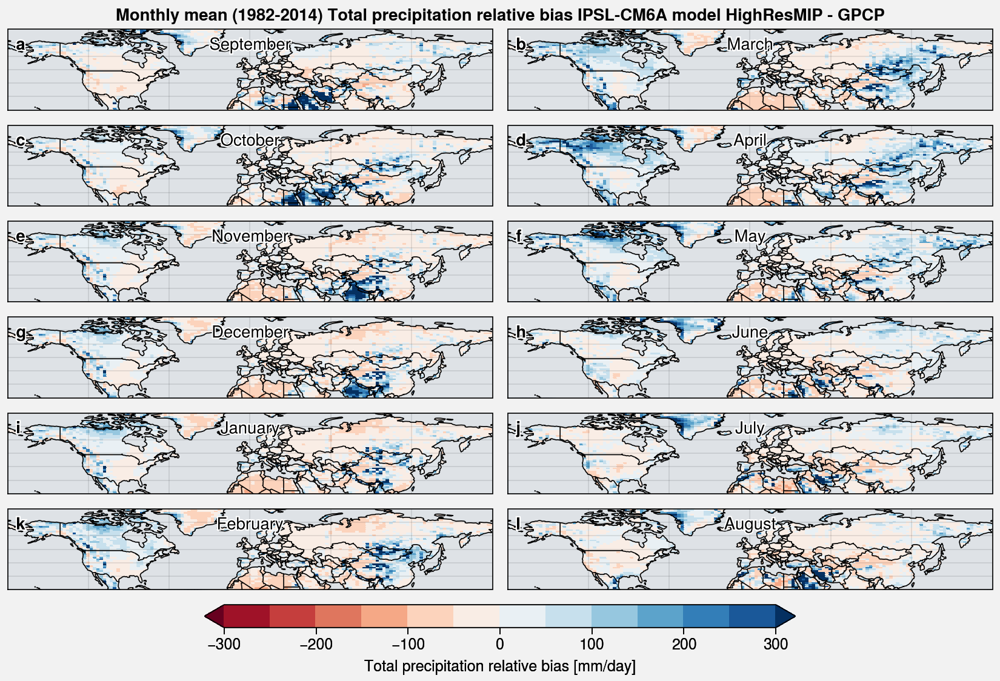

In [43]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh((da_HR_regrid_mon.sel(month=i) - gpcp_regrid_mon.sel(month=i))/gpcp_regrid_mon.sel(month=i)*100, cmap='RdBu', levels=plot.arange(-300,300,50), extend='both')
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-9]+' relative bias '+var_label[-8:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-9]+" relative bias IPSL-CM6A model HighResMIP - GPCP",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/pr_mon_rel_bias_1982-2014_HR_GPCP.jpg')

# Annual cycle on the different zones

In [88]:
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TB, latlim_TB = u.get_zones_IPSL_CM6A_LR()

# # Old single zone
# # lonlim_zone=(78,78+20)
# # latlim_zone=(27,27+11)

# dx=2.5
# dy=1.2676

# lonlim_WH=(70-dx/2,70-dx/2+10)
# latlim_WH=(31.690142-dy/2+dy,31.690142-dy/2+dy+7.6056339+dy)

# lonlim_CH=(77.5-dx/2+dx,77.5-dx/2+dx+15)
# latlim_CH=(26.619719-dy/2,26.619719-dy/2+3.802816)

# lonlim_TB=(82.5-dx/2-dx,82.5-dx/2-dx+15+2*dx)
# latlim_TB=(31.690142-dy/2-dy,31.690142-dy/2-dy+7.6056339)

# Annual cycle ensemble mean
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
## Charger tout comme ça on fait les cycles annuels + time series avec le shading sur les 3 zones à la volé

In [109]:
plot.rc.cycle = 'colorblind'

realization = '*'
da_historical_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

da_amip_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/amip/'+realization+'/'+table+'/'+var+'/gr/latest/*-201412.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

In [110]:
var = 'prsn'
plot.rc.cycle = 'colorblind'

realization = '*'
da_historical_ens_sn = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

da_amip_ens_sn = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/amip/'+realization+'/'+table+'/'+var+'/gr/latest/*-201412.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

var = 'pr'

In [111]:
da_historical_ens

<xarray.DataArray 'pr' (realization: 32, time: 408, lat: 32, lon: 21)>
array([[[[2.82460496e-05, 3.99401833e-05, 7.59101968e-05, ...,
          0.00000000e+00, 9.62097624e-10, 1.53777000e-05],
         [1.65145848e-05, 3.12449338e-05, 9.63538187e-05, ...,
          0.00000000e+00, 6.42719939e-08, 9.40244445e-06],
         [1.56632250e-05, 3.37696656e-05, 7.29363237e-05, ...,
          0.00000000e+00, 1.78351650e-06, 7.78922094e-06],
         ...,
         [8.05490981e-06, 9.92342484e-06, 1.00506713e-05, ...,
          3.44116665e-06, 1.68117333e-06, 7.02484385e-07],
         [1.02757631e-05, 1.32422829e-05, 1.74138877e-05, ...,
          5.35192203e-06, 4.78836728e-06, 7.36033144e-07],
         [1.30090912e-05, 1.64123867e-05, 1.90269748e-05, ...,
          3.18711977e-06, 1.06267817e-05, 4.52830818e-06]],

        [[9.14731913e-07, 4.07134348e-06, 3.07737537e-06, ...,
          6.95099607e-06, 6.28352836e-07, 1.60699267e-06],
         [7.81048357e-07, 3.77964227e-07, 3.83328256e-07, ...,
          7.68032533e-06, 2.35117227e-06, 1.76918218e-06],
         [3.27070950e-07, 6.16777129e-07, 1.10063445e-06, ...,
          5.07296681e-06, 6.78954530e-06, 9.71211165e-08],
         ...,
         [5.00024225e-06, 4.52226732e-06, 5.81287213e-06, ...,
          1.45471233e-06, 1.46548609e-06, 1.30405499e-06],
         [3.25991005e-06, 4.69000224e-06, 7.88817397e-06, ...,
          3.27512521e-06, 4.09538006e-06, 9.22414642e-07],
         [2.97117981e-06, 6.25385337e-06, 1.15198291e-05, ...,
          1.34584786e-06, 8.06799835e-06, 4.59197872e-06]],

        [[3.57941900e-07, 2.60375288e-07, 1.33433574e-07, ...,
          1.67858288e-05, 3.46765205e-06, 2.49181062e-06],
         [1.58781631e-07, 5.37904953e-07, 2.80070822e-07, ...,
          2.83161189e-05, 9.54696134e-06, 2.53483813e-06],
         [3.19650383e-07, 1.95588328e-07, 1.33538322e-07, ...,
          2.84381567e-05, 2.18540335e-05, 1.01713601e-06],
         ...,
         [9.75968396e-06, 9.84383860e-06, 1.40103793e-05, ...,
          3.70450630e-06, 4.06365598e-06, 5.35720756e-06],
         [1.64760258e-05, 1.40433094e-05, 1.90604278e-05, ...,
          2.17914635e-06, 5.23689368e-06, 7.07294430e-06],
         [1.46998173e-05, 1.67774269e-05, 1.63413570e-05, ...,
          3.50432902e-06, 9.32446255e-06, 2.38860484e-05]],

        ...,

        [[5.48402095e-05, 1.14441653e-04, 7.59897302e-05, ...,
          7.18128867e-05, 1.55295595e-04, 1.15528324e-04],
         [5.22629998e-05, 1.34626389e-04, 1.17827673e-04, ...,
          8.35911414e-05, 1.54073481e-04, 1.84311459e-04],
         [4.95884087e-05, 7.84873482e-05, 9.20376042e-05, ...,
          7.86320234e-05, 1.82792326e-04, 2.17486944e-04],
         ...,
         [8.45775332e-07, 2.73837259e-06, 5.24313509e-06, ...,
          6.02708997e-06, 2.21275855e-06, 2.42358283e-06],
         [5.87417071e-06, 9.73875467e-06, 1.64541652e-05, ...,
          4.94481083e-06, 1.61433873e-05, 6.55266513e-06],
         [3.99836472e-06, 6.42351142e-06, 1.39322447e-05, ...,
          1.48297443e-06, 1.83304965e-05, 1.93158339e-05]],

        [[1.39290831e-04, 1.18706586e-04, 1.01793688e-04, ...,
          4.20615033e-05, 1.29189080e-04, 3.94622475e-04],
         [6.12770236e-05, 7.99260088e-05, 6.15494137e-05, ...,
          1.34260881e-05, 1.06488005e-04, 4.47881263e-04],
         [2.29269954e-05, 5.09235397e-05, 6.94309056e-05, ...,
          1.65107360e-06, 4.11918991e-05, 2.56848696e-04],
         ...,
         [9.08502784e-07, 1.20933487e-06, 5.16474574e-06, ...,
          4.23347637e-06, 2.83873283e-06, 8.18565297e-07],
         [4.49607387e-06, 1.09353605e-05, 1.45841386e-05, ...,
          2.96632606e-06, 5.42944372e-06, 8.03015212e-07],
         [1.91881736e-05, 1.42863928e-05, 1.22249512e-05, ...,
          2.32273305e-06, 1.08745162e-05, 8.25673851e-06]],

        [[3.08177769e-05, 3.57324061e-05, 5.77914652e-05, ...,
          6.76677109e-06, 9.12273299e-06, 1.05828018e-04],
         [4.96678658e-05, 2.37689073e-05, 3.43024622e

In [112]:
da_amip_ens

<xarray.DataArray 'pr' (realization: 21, time: 408, lat: 32, lon: 21)>
array([[[[4.64259392e-05, 3.46237903e-05, 3.80256024e-05, ...,
          1.02386184e-06, 5.38646134e-07, 3.38429891e-05],
         [3.34773795e-05, 2.64575538e-05, 2.58939781e-05, ...,
          1.10425060e-06, 5.70771272e-06, 3.68893925e-05],
         [7.37316623e-06, 9.72894031e-06, 5.47116178e-06, ...,
          0.00000000e+00, 5.34233232e-06, 1.72579803e-05],
         ...,
         [1.09331986e-05, 1.14426794e-05, 1.89755956e-05, ...,
          2.01103740e-06, 2.29339912e-06, 2.47928187e-06],
         [8.90539013e-06, 1.08001886e-05, 1.94574150e-05, ...,
          3.16437786e-06, 4.10172788e-06, 3.22991286e-06],
         [1.09590410e-05, 1.21395833e-05, 1.74841789e-05, ...,
          2.36576238e-06, 5.95102438e-06, 4.62651542e-06]],

        [[9.17031684e-06, 1.57528357e-05, 5.65931550e-05, ...,
          6.77007392e-06, 1.11553028e-07, 3.91951698e-06],
         [1.42292242e-06, 1.18464300e-06, 4.65648518e-05, ...,
          1.56458700e-05, 1.19350616e-05, 3.88376111e-06],
         [1.82436611e-06, 4.42000783e-08, 3.39218277e-05, ...,
          1.50859378e-05, 1.56734659e-05, 4.35449550e-07],
         ...,
         [6.39693462e-06, 5.06222887e-06, 3.20862932e-06, ...,
          2.21334426e-06, 1.60615912e-06, 1.15685634e-06],
         [7.31105411e-06, 6.90979414e-06, 7.28473651e-06, ...,
          4.24535892e-06, 3.69979762e-06, 1.83178975e-06],
         [8.62359502e-06, 8.02724662e-06, 1.07607075e-05, ...,
          3.07696769e-06, 6.92048525e-06, 5.98933002e-06]],

        [[1.83289485e-05, 7.13379850e-05, 4.55782429e-05, ...,
          3.20059917e-05, 1.29321970e-05, 2.26769735e-05],
         [2.88471892e-05, 6.27898407e-05, 3.80759520e-05, ...,
          4.05850187e-05, 3.83779807e-05, 1.76552803e-05],
         [3.37498168e-05, 4.45075711e-05, 1.66530845e-05, ...,
          3.31708543e-05, 4.47028942e-05, 1.42126364e-05],
         ...,
         [1.03847542e-05, 8.49594653e-06, 8.55481903e-06, ...,
          5.92968627e-06, 6.80668109e-06, 5.59461478e-06],
         [1.58171133e-05, 1.24120734e-05, 1.33878711e-05, ...,
          7.61877482e-06, 1.09698376e-05, 7.55264318e-06],
         [1.24145681e-05, 1.59025039e-05, 2.44989278e-05, ...,
          7.22377217e-06, 1.35485598e-05, 1.09902312e-05]],

        ...,

        [[2.83055724e-05, 2.74387821e-05, 2.97179722e-05, ...,
          8.11197024e-05, 7.95235901e-05, 1.36206494e-04],
         [3.58587204e-05, 3.40920378e-05, 3.10750074e-05, ...,
          1.11290159e-04, 2.11521634e-04, 2.06774232e-04],
         [3.72218092e-05, 4.01319485e-05, 3.77545730e-05, ...,
          7.99523405e-05, 2.08557962e-04, 3.76146316e-04],
         ...,
         [1.55499038e-07, 3.60817830e-06, 6.47366733e-06, ...,
          2.25497433e-06, 7.60496732e-07, 1.97702885e-08],
         [1.69158591e-06, 9.67044252e-06, 1.21279991e-05, ...,
          2.34756158e-06, 5.27188240e-06, 7.56880752e-07],
         [2.00131058e-06, 3.79411722e-06, 9.15317014e-06, ...,
          3.66372160e-06, 9.60808757e-06, 1.11422214e-05]],

        [[3.70216658e-05, 3.96087089e-05, 4.19768767e-05, ...,
          4.13341659e-05, 5.76012753e-05, 1.10978377e-04],
         [3.87742766e-05, 3.66529093e-05, 3.85891617e-05, ...,
          3.39706894e-05, 1.01160906e-04, 1.69803316e-04],
         [5.91405587e-05, 4.16762596e-05, 3.61542589e-05, ...,
          2.06796049e-05, 1.10968525e-04, 2.87449802e-04],
         ...,
         [2.30246587e-06, 7.00098417e-06, 4.24999553e-06, ...,
          1.15529144e-06, 3.53200591e-07, 2.37161885e-06],
         [6.15714862e-06, 1.15792200e-05, 1.30081671e-05, ...,
          1.57440866e-06, 8.90786487e-06, 1.75300556e-06],
         [1.36209019e-05, 1.30969356e-05, 1.31964734e-05, ...,
          3.99080545e-06, 1.88220165e-05, 7.65918776e-06]],

        [[4.22722806e-05, 4.62809912e-05, 9.23207044e-05, ...,
          2.06625537e-05, 3.63948457e-05, 9.50740869e-05],
         [2.20014645e-05, 3.02849512e-05, 5.67873758e

In [113]:
# To mm/day
da_historical_ens = da_historical_ens*86400
da_amip_ens = da_amip_ens*86400

da_historical_ens_sn = da_historical_ens_sn*86400
da_amip_ens_sn = da_amip_ens_sn*86400

In [114]:
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TB, latlim_TB = u.get_zones_IPSL_CM6A_LR()

titles = ['HK', 'HM', 'TB']
zone_slices = [
    [slice(lonlim_HK[0],lonlim_HK[1]), slice(latlim_HK[0],latlim_HK[1])],
    [slice(lonlim_HM[0],lonlim_HM[1]), slice(latlim_HM[0],latlim_HM[1])],
    [slice(lonlim_TB[0],lonlim_TB[1]), slice(latlim_TB[0],latlim_TB[1])]
]

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: 

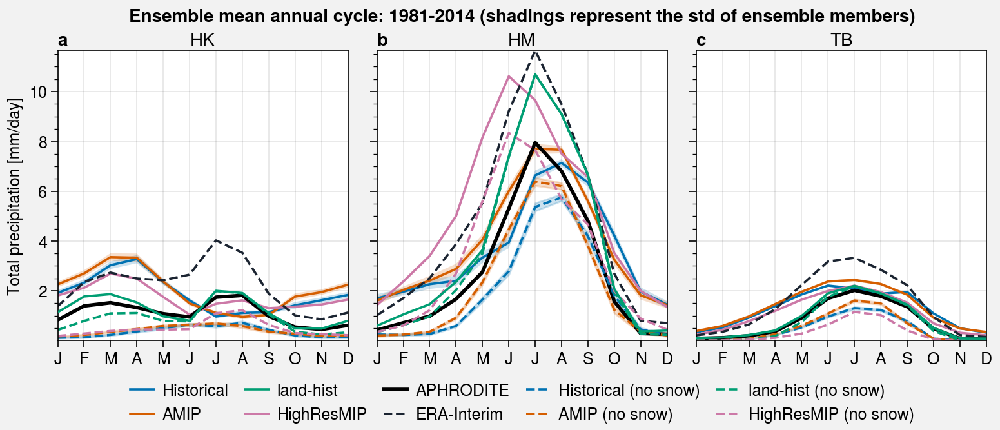

In [118]:
f, axs = plot.subplots(ncols=3, nrows=1)

for i, ax in enumerate(axs):
    
    # Compute annual cycles on the zone
    # Ensemble
    ac_historical_ens = u.annual_cycle(u.spatial_average(
        da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    ac_amip_ens = u.annual_cycle(u.spatial_average(
        da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()

    # Not ensemble
    ac_land_hist = u.annual_cycle(u.spatial_average(
        da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    ac_HR_regrid = u.annual_cycle(u.spatial_average(
        da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    ac_obs_regrid = u.annual_cycle(u.spatial_average(
        obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    ac_era_regrid = u.annual_cycle(u.spatial_average(
        era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    
    
    # historical
    x = ac_historical_ens.month
    y = ac_historical_ens.mean('realization').persist()
    std = ac_historical_ens.std('realization').persist()
    h1 = y.plot(ax=ax, label='Historical')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    
    # amip
    x = ac_amip_ens.month
    y = ac_amip_ens.mean('realization').persist()
    std = ac_historical_ens.std('realization').persist()
    h2 = y.plot(ax=ax, label='AMIP')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    
    # land_hist
    h3 = ac_land_hist.plot(ax=ax, label='land-hist', zorder=10)
    
    # HighResMIP
    h4 = ac_HR_regrid.plot(ax=ax, label='HighResMIP')
    
    # Obs
    h5 = ac_obs_regrid.plot(ax=ax, label=obs_name, color='black', linewidth=2)
    h6 = ac_era_regrid.plot(ax=ax, label='ERA-Interim', color='dark', linestyle='--')
    
    
    
    
    # Add rain without snow
    ac_historical_ens_prra = u.annual_cycle(u.spatial_average(
        (da_historical_ens-da_historical_ens_sn).sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    ac_amip_ens_prra = u.annual_cycle(u.spatial_average(
        (da_amip_ens-da_amip_ens_sn).sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()

    # Not ensemble
    ac_land_hist_prra = u.annual_cycle(u.spatial_average(
        (da_land_hist-da_land_hist_sn).sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    ac_HR_regrid_prra = u.annual_cycle(u.spatial_average(
        (da_HR_regrid-da_HR_regrid_sn).sel(lon=zone_slices[i][0], lat=zone_slices[i][1])
    )).persist()
    
    # historical
    x = ac_historical_ens_prra.month
    y = ac_historical_ens_prra.mean('realization').persist()
    std = ac_historical_ens_prra.std('realization').persist()
    h7 = y.plot(ax=ax, label='Historical (no snow)', linestyle='--', color='C0')
    ax.fill_between(x, y-std, y+std, alpha=0.2, color='C0')
    
    # amip
    x = ac_amip_ens_prra.month
    y = ac_amip_ens_prra.mean('realization').persist()
    std = ac_historical_ens_prra.std('realization').persist()
    h8 = y.plot(ax=ax, label='AMIP (no snow)', linestyle='--', color='C1')
    ax.fill_between(x, y-std, y+std, alpha=0.2, color='C1')
    
    # land_hist
    h9 = ac_land_hist_prra.plot(ax=ax, label='land-hist (no snow)', linestyle='--', color='C2')
    
    # HighResMIP
    h10 = ac_HR_regrid_prra.plot(ax=ax, label='HighResMIP (no snow)', linestyle='--', color='C3')
    
    
    
    
    
    
    ax.format(title=titles[i])
    hs = [h1, h2, h3, h4, h5, h6, h7, h8, h9, h10]

axs.format(
    xlocator='index', xformatter=['J','F','M','A','M','J','J','A','S','O','N','D'], xtickminor=False,
    xlabel='', ylabel=var_label,
    suptitle='Ensemble mean annual cycle: 1982-2014 (shadings represent the std of ensemble members)', 
    abc=True,
#     ylim=(0,80)
)
    
f.legend(hs, loc='b', ncols=5, order='F', center=False, frame=False)

f.save('img/'+var+'/ac_ens_zones_'+var+'_no_snow.png')
f.save('img/'+var+'/ac_ens_zones_'+var+'_no_snow.pdf')